# The College Accessability Index


From the Malcolm Gladwell podcast -- revisionist history on Vassar versus Bodoin

* [The Article](http://www.nytimes.com/2015/09/17/upshot/college-access-index-2015-the-details.html?_r=0)

* [The IPEDS website for data](https://nces.ed.gov/ipeds/datacenter/DataFiles.aspx)




We then multiplied this graduation rate by the share of first-year students who received Pell grants in recent years. This number led to one half of a college’s index number. The other half came from the average price — tuition, fees, room and board, net of financial aid — that the college charged students from families with between \$30,000 and \$75,000 in annual income.

The overall goal remains the same: examining economic diversity at colleges where graduation is the norm.

Second, we tried to give colleges credit only for those lower-income students who graduate rather than all those who enroll. To do so, we asked colleges to provide their graduation rate for students receiving Pell grants, the federal financial-aid program that typically helps students coming from the bottom 40 percent of the income distribution.


In [223]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
from ggplot import *
from altair import *

In [224]:
ls


0_playerInfo.xlsx            ipeds.ipynb            Untitled1.ipynb
AltairTutorial/              minard.txt             Untitled2.ipynb
anscombe_all.csv             mystery1.csv           Untitled.ipynb
APC_enrolls.ipynb            mystery2.csv           week1.xlsx
ClassSizeGraph.ipynb         mystery3.csv           week2.csv
Class_Size_History-1.xlsm    mystery4.csv           week3.csv
CSClassSize.xls              mysteryAnalysis.ipynb  week4.csv
dataviz-with-python-and-js/  playerInfo.xlsx        week5.csv
FantasyFootball.ipynb        SFA1112/               week6 copy.csv
GasPricesAndCPI/             SFA1213/               week6.csv
ggplot class.ipynb           sfa1314.csv*           week8.csv
gr2014.csv*                  sfa1314.xlsx*          week9.csv
hd2014.csv*                  stacked_bar.html
hd2015.csv*                  Tableau1.twb


In [225]:
fa = pd.read_csv('sfa1314.csv')
fa.head()

,UNITID,XSCUGRAD,SCUGRAD,XSCUGFFN,SCUGFFN,XSCUGFFP,SCUGFFP,XSCFA2,SCFA2,XSCFA1N,...,XNPT410,NPT410,XNPT420,NPT420,XNPT430,NPT430,XNPT440,NPT440,XNPT450,NPT450
0,100654,R,4051,R,1066,R,26,R,4051.0,R,...,A,NaN,A,NaN,A,NaN,A,NaN,A,NaN
1,100663,R,11542,R,1732,R,15,R,11542.0,R,...,A,NaN,A,NaN,A,NaN,A,NaN,A,NaN
2,100690,R,322,R,3,R,1,R,322.0,R,...,R,6332.0,R,8364.0,A,NaN,A,NaN,A,NaN
3,100706,R,5696,R,638,R,11,R,5696.0,R,...,A,NaN,A,NaN,A,NaN,A,NaN,A,NaN
4,100724,R,5356,R,1520,R,28,R,5356.0,R,...,A,NaN,A,NaN,A,NaN,A,NaN,A,NaN


In [226]:
fa.columns


Index(['UNITID', 'XSCUGRAD', 'SCUGRAD', 'XSCUGFFN', 'SCUGFFN', 'XSCUGFFP',
       'SCUGFFP', 'XSCFA2', 'SCFA2', 'XSCFA1N',
       ...
       'XNPT410', 'NPT410', 'XNPT420', 'NPT420', 'XNPT430', 'NPT430',
       'XNPT440', 'NPT440', 'XNPT450', 'NPT450  '],
      dtype='object', length=647)

In [227]:
hd = pd.read_csv('hd2014.csv',encoding="ISO-8859-1")

In [228]:
hd.head()
hd.columns

Index(['UNITID', 'INSTNM', 'ADDR', 'CITY', 'STABBR', 'ZIP', 'FIPS', 'OBEREG',
       'CHFNM', 'CHFTITLE', 'GENTELE', 'EIN', 'OPEID', 'OPEFLAG', 'WEBADDR',
       'ADMINURL', 'FAIDURL', 'APPLURL', 'NPRICURL', 'VETURL', 'ATHURL',
       'SECTOR', 'ICLEVEL', 'CONTROL', 'HLOFFER', 'UGOFFER', 'GROFFER',
       'HDEGOFR1', 'DEGGRANT', 'HBCU', 'HOSPITAL', 'MEDICAL', 'TRIBAL',
       'LOCALE', 'OPENPUBL', 'ACT', 'NEWID', 'DEATHYR', 'CLOSEDAT', 'CYACTIVE',
       'POSTSEC', 'PSEFLAG', 'PSET4FLG', 'RPTMTH', 'IALIAS', 'INSTCAT',
       'CCBASIC', 'CCIPUG', 'CCIPGRAD', 'CCUGPROF', 'CCENRPRF', 'CCSIZSET',
       'CARNEGIE', 'LANDGRNT', 'INSTSIZE', 'CBSA', 'CBSATYPE', 'CSA', 'NECTA',
       'F1SYSTYP', 'F1SYSNAM', 'F1SYSCOD', 'COUNTYCD', 'COUNTYNM', 'CNGDSTCD',
       'LONGITUD', 'LATITUDE', 'DFRCGID', 'DFRCUSCG'],
      dtype='object')

In [229]:
#ggplot(hd, aes(x='INSTSIZE')) + geom_histogram(bins=20, color='blue')


In [230]:
hd[(hd.STABBR=='IA') | (hd.STABBR=='MN')]

,UNITID,INSTNM,ADDR,CITY,STABBR,ZIP,FIPS,OBEREG,CHFNM,CHFTITLE,...,F1SYSTYP,F1SYSNAM,F1SYSCOD,COUNTYCD,COUNTYNM,CNGDSTCD,LONGITUD,LATITUDE,DFRCGID,DFRCUSCG
586,125231,Walden University,"100 Washington Avenue South, Suite 900",Minneapolis,MN,55401,27,4,Cynthia Baum,President,...,1,Laureate Education Inc.,302810,27053,Hennepin,2705,-93.265731,44.981370,233,1
1306,152798,Allen College,1990 Heath St,Waterloo,IA,50703-1999,19,4,Jerry Durham,Chancellor,...,2,,-2,19013,Black Hawk,1901,-92.338018,42.531427,183,2
1307,152822,AIB College of Business,2500 Fleur Drive,Des Moines,IA,50321-1799,19,4,Nancy Williams,President,...,2,,-2,19153,Polk,1903,-93.645694,41.561953,187,1
1308,152992,Briar Cliff University,3303 Rebecca Street,Sioux City,IA,51104,19,4,Beverly Wharton,President,...,2,,-2,19193,Woodbury,1904,-96.426960,42.526919,164,1
1309,153001,Buena Vista University,610 W 4th St,Storm Lake,IA,50588,19,4,Frederick V Moore,President,...,2,,-2,19021,Buena Vista,1904,-95.208053,42.642529,160,2
1310,153074,Capri College-Dubuque,395 Main St,Dubuque,IA,52004-0873,19,4,Charles Fiegen,Owner,...,1,Fiegen & Bisenius Inc.,302010,19061,Dubuque,1901,-90.665345,42.497443,32,2
1311,153083,Capri College-Cedar Rapids,2945 Williams Parkway S.W.,Cedar Rapids,IA,52404,19,4,Charles Fiegen,Owner,...,1,Fiegen & Bisenius Inc.,302010,19113,Linn,1901,-91.710270,41.960700,24,2
1312,153092,American College of Hairstyling-Cedar Rapids,1531 First Ave SE,Cedar Rapids,IA,52402,19,4,T L Millis,President,...,1,American Colleges of Hairstyling Inc.,300230,19113,Linn,1901,-91.733905,41.967378,62,2
1313,153108,Central College,812 University,Pella,IA,50219,19,4,Mark Putnam,President,...,2,,-2,19125,Marion,1902,-92.918664,41.400236,155,1
1314,153126,Clarke University,1550 Clarke Dr,Dubuque,IA,52001-3198,19,4,"Joanne M. Burrows, SC, Ph.D.",President,...,2,,-2,19061,Dubuque,1901,-90.691512,42.508619,163,1


In [231]:
fa[fa.UNITID==153834][['UFLOANP','SCUGRAD','SCUGFFN','PGRNT_P']]

,UFLOANP,SCUGRAD,SCUGFFN,PGRNT_P
1232,67,2466,627,21.0


### Pell grants for first year students

PGRNT_P


In [232]:
fa['PGRNT_P'].head()

0     80.0
1     34.0
2    100.0
3     25.0
4     71.0
Name: PGRNT_P, dtype: float64

In [233]:
m = pd.merge(fa, hd, left_on='UNITID', right_on='UNITID')

In [234]:
mw = m[(m.STABBR == 'IA') | (m.STABBR == 'MN') | (m.STABBR == 'WI') & (m.INSTSIZE == 2)]
mw = mw.sort_values('PGRNT_P',ascending=False)

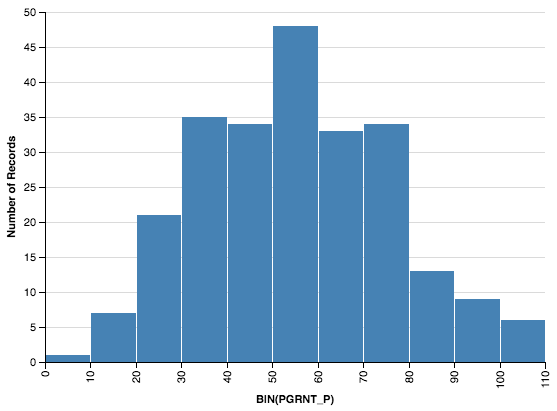

In [235]:
Chart(mw).mark_bar().encode(
    X('PGRNT_P', bin=True),
    Y('count(*):Q')
)

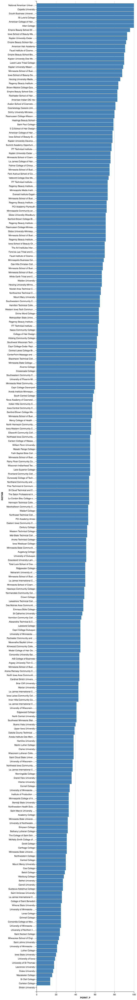

In [236]:
# Chart(mw).mark_bar().encode(
#     x='PGRNT_P',
#     y=Y('INSTNM', sort=SortField(field='PGRNT_P', order='descending'))
# )

In [237]:
mw[mw.INSTNM == 'Luther College']['UNITID']

1232    153834
Name: UNITID, dtype: int64

In [238]:
gr = pd.read_csv('gr2014.csv')

In [239]:
mw

,UNITID,XSCUGRAD,SCUGRAD,XSCUGFFN,SCUGFFN,XSCUGFFP,SCUGFFP,XSCFA2,SCFA2,XSCFA1N,...,F1SYSTYP,F1SYSNAM,F1SYSCOD,COUNTYCD,COUNTYNM,CNGDSTCD,LONGITUD,LATITUDE,DFRCGID,DFRCUSCG
5063,436483,R,509,R,1,R,0,R,509.0,R,...,1,Dlorah Inc.,301350,27053,Hennepin,2703,-93.228669,44.861375,209,2
4703,413413,R,7947,R,2,R,0,R,7947.0,R,...,2,,-2,27053,Hennepin,2705,-93.268714,44.976186,233,1
1808,173489,R,201,R,6,R,3,R,201.0,R,...,2,,-2,27137,St. Louis,2708,-92.157379,46.742888,211,2
1248,154262,R,184,R,1,R,1,R,184.0,R,...,1,Iowa Health System,200740,19193,Woodbury,1904,-96.404922,42.517806,203,2
1192,153092,R,18,R,10,R,56,A,NaN,A,...,1,American Colleges of Hairstyling Inc.,300230,19113,Linn,1901,-91.733905,41.967378,62,2
1186,152798,R,398,R,1,R,0,R,398.0,R,...,2,,-2,19013,Black Hawk,1901,-92.338018,42.531427,183,2
5452,445504,R,116,R,23,R,20,A,NaN,A,...,1,EEG Inc.,301640,27123,Ramsey,2704,-93.019755,44.950693,43,2
1197,153171,R,51,R,14,R,27,A,NaN,A,...,1,Iowa School of Beauty Inc.,302550,19127,Marshall,1901,-92.913104,42.014681,51,2
1212,153418,R,483,R,28,R,6,R,483.0,R,...,1,Kaplan Higher Education Corporation,302640,19113,Linn,1901,-91.713507,41.949597,207,2
6039,456135,R,165,R,36,R,22,A,NaN,A,...,1,EEG Inc.,301640,27003,Anoka,2705,-93.262399,45.116629,40,2


In [240]:
gr.head()

,UNITID,GRTYPE,CHRTSTAT,SECTION,COHORT,LINE,XGRTOTLT,GRTOTLT,XGRTOTLM,GRTOTLM,...,XGRUNKNM,GRUNKNM,XGRUNKNW,GRUNKNW,XGRNRALT,GRNRALT,XGRNRALM,GRNRALM,XGRNRALW,GRNRALW
0,100654,2,12,1,1,999,R,1044,R,476.0,...,R,0.0,R,0.0,R,12.0,R,6.0,R,6.0
1,100654,3,13,1,1,999,R,368,R,128.0,...,Z,0.0,Z,0.0,R,1.0,Z,0.0,R,1.0
2,100654,6,10,2,2,10,R,1044,R,476.0,...,R,0.0,R,0.0,R,12.0,R,6.0,R,6.0
3,100654,8,12,2,2,50,R,1044,R,476.0,...,R,0.0,R,0.0,R,12.0,R,6.0,R,6.0
4,100654,9,13,2,2,29A,R,368,R,128.0,...,Z,0.0,Z,0.0,R,1.0,Z,0.0,R,1.0


In [241]:
luth = gr[gr.UNITID == 153834]
luth.head()

,UNITID,GRTYPE,CHRTSTAT,SECTION,COHORT,LINE,XGRTOTLT,GRTOTLT,XGRTOTLM,GRTOTLM,...,XGRUNKNM,GRUNKNM,XGRUNKNW,GRUNKNW,XGRNRALT,GRNRALT,XGRNRALM,GRNRALM,XGRNRALW,GRNRALW
12899,153834,2,12,1,1,999,R,630,R,259.0,...,R,24.0,R,31.0,R,27.0,R,16.0,R,11.0
12900,153834,3,13,1,1,999,R,514,R,214.0,...,R,15.0,R,24.0,R,24.0,R,14.0,R,10.0
12901,153834,6,10,2,2,10,R,630,R,259.0,...,R,24.0,R,31.0,R,27.0,R,16.0,R,11.0
12902,153834,8,12,2,2,50,R,630,R,259.0,...,R,24.0,R,31.0,R,27.0,R,16.0,R,11.0
12903,153834,9,13,2,2,29A,R,514,R,214.0,...,R,15.0,R,24.0,R,24.0,R,14.0,R,10.0


In [242]:
luth.pivot(index='UNITID',columns='GRTYPE',values='GRTOTLT')

GRTYPE,2,3,6,8,9,12,13,14,15,42,44
UNITID,,,,,,,,,,,
153834,630,514,630,630,514,514,469,41,4,116,116


In [243]:
allgr = gr.pivot(index='UNITID',columns='GRTYPE',values='GRTOTLT')


In [244]:
mw[['INSTNM','PGRNT_P']]

,INSTNM,PGRNT_P
5063,National American University-Bloomington,100.0
4703,Capella University,100.0
1808,Duluth Business University,100.0
1248,St Luke's College,100.0
1192,American College of Hairstyling-Cedar Rapids,100.0
1186,Allen College,100.0
5452,Empire Beauty School-St Paul,96.0
1197,Iowa School of Beauty-Marshalltown,93.0
1212,Kaplan University-Cedar Rapids Campus,93.0
6039,Empire Beauty School-Spring Lake Park,92.0


In [245]:
allgr = allgr[[2,3]]
allgr = allgr.reset_index()
allgr.head()

GRTYPE,UNITID,2,3
0,100654,1044.0,368.0
1,100663,1246.0,692.0
2,100690,9.0,2.0
3,100706,765.0,353.0
4,100724,1330.0,350.0


In [246]:
with_grad = pd.merge(mw, allgr, left_on='UNITID', right_on='UNITID')

In [247]:
with_grad[['INSTNM','PGRNT_P',2,3]]

,INSTNM,PGRNT_P,2,3
0,National American University-Bloomington,100.0,9.0,1.0
1,Capella University,100.0,5.0,NaN
2,Duluth Business University,100.0,70.0,32.0
3,St Luke's College,100.0,2.0,2.0
4,American College of Hairstyling-Cedar Rapids,100.0,NaN,NaN
5,Allen College,100.0,4.0,3.0
6,Iowa School of Beauty-Marshalltown,93.0,NaN,NaN
7,Kaplan University-Cedar Rapids Campus,93.0,72.0,21.0
8,American Hair Academy,91.0,NaN,NaN
9,Faust Institute of Cosmetology-Storm Lake,91.0,NaN,NaN


In [248]:
with_grad = with_grad.dropna(subset=[2,3])#[['INSTNM','PGRNT_P',2,3]]


In [249]:
with_grad = with_grad.rename(columns={2:'start_size', 3:'six_year_grads'})


In [250]:
smaller = with_grad[with_grad.start_size > 400].copy()

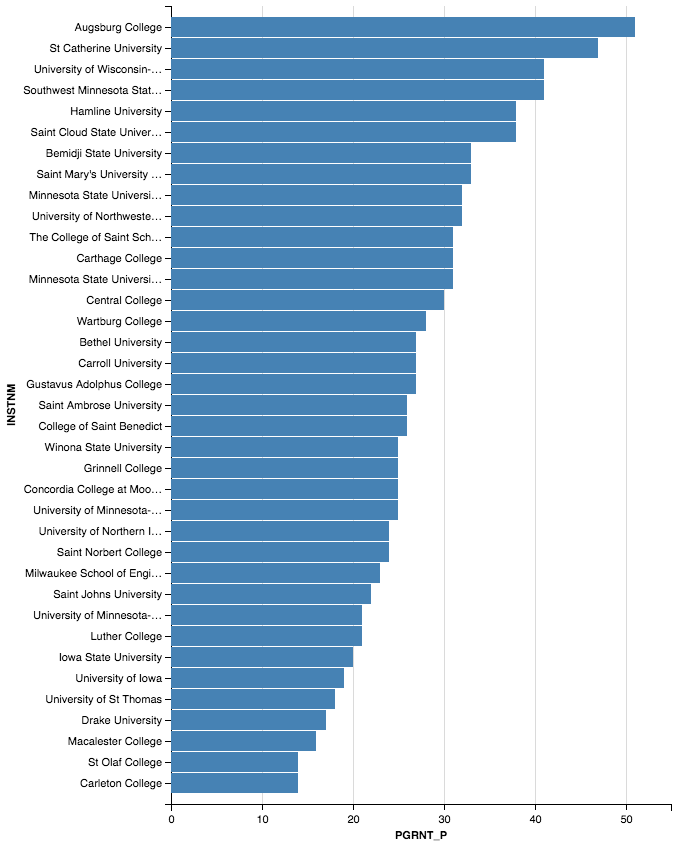

In [251]:
# Chart(smaller).mark_bar().encode(
#     x='PGRNT_P',
#     y=Y('INSTNM', sort=SortField(field='PGRNT_P', order='descending'))
# )

In [252]:
smaller['grad_rate'] = smaller.six_year_grads / smaller.start_size * 100.0
smaller['idxp1'] = smaller.PGRNT_P * smaller.grad_rate

In [253]:
smaller.head()

,UNITID,XSCUGRAD,SCUGRAD,XSCUGFFN,SCUGFFN,XSCUGFFP,SCUGFFP,XSCFA2,SCFA2,XSCFA1N,...,COUNTYNM,CNGDSTCD,LONGITUD,LATITUDE,DFRCGID,DFRCUSCG,start_size,six_year_grads,grad_rate,idxp1
106,173045,R,2716,R,463,R,17,R,2716.0,R,...,Hennepin,2705,-93.241418,44.965636,135,1,447.0,280.0,62.639821,3194.630872
120,175005,R,3559,R,419,R,12,R,3559.0,R,...,Ramsey,2704,-93.181925,44.924542,135,1,422.0,247.0,58.530806,2750.947867
141,240374,R,4450,R,686,R,15,R,4450.0,R,...,Kenosha,5501,-87.855407,42.646074,150,1,833.0,255.0,30.612245,1255.102041
144,175078,R,6467,R,445,R,7,R,6467.0,R,...,Lyon,2707,-95.759830,44.455023,141,2,500.0,216.0,43.200000,1771.200000
149,173665,R,2164,R,536,R,25,R,2164.0,R,...,Ramsey,2704,-93.163983,44.965696,134,1,449.0,290.0,64.587973,2454.342984


In [254]:
smaller[smaller.INSTNM == 'Augsburg College'][['idxp1','PGRNT_P','six_year_grads','start_size']]

,idxp1,PGRNT_P,six_year_grads,start_size
106,3194.630872,51.0,280.0,447.0


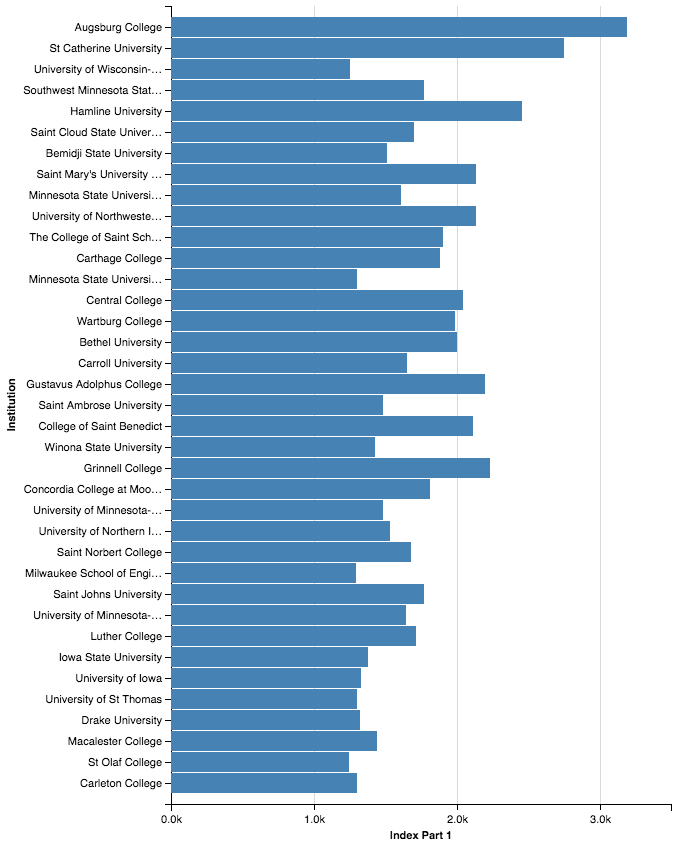

In [259]:
# smaller.sort_values('idxp1',ascending=False)
# Chart(smaller).mark_bar().encode(
#     x=X('idxp1', title='Index Part 1'),
#     y=Y('INSTNM', sort=SortField(field='idxp1', order='descending'), title='Institution')
# )

In [256]:
x = SortField(field='INSTNM', order='descending')

Now for part 2 we need to look at financial aid:  The other half came from the average price — tuition, fees, room and board, net of financial aid — that the college charged students from families with between \$30,000 and \$75,000 in annual income.

College Access Index. Once we calculated an adjusted Pell share and a net price for each college, we then calculated an average of each number for all 179 colleges. Each college’s adjusted Pell share was then compared with the average Pell share, and each net price was compared with the average net price. These two comparisons were combined to create the index.

An index value of 1 is average. A value higher than 1 suggests a greater commitment to economic diversity.


This year’s index values are not on the same scale as last year’s, but the order of colleges included in both this year’s and last year’s index is similar. The biggest change to the order, by far, comes from the inclusion of additional colleges.

In [264]:
smaller['avg_price'] = (smaller.NPT420 + smaller.NPT430) / 2

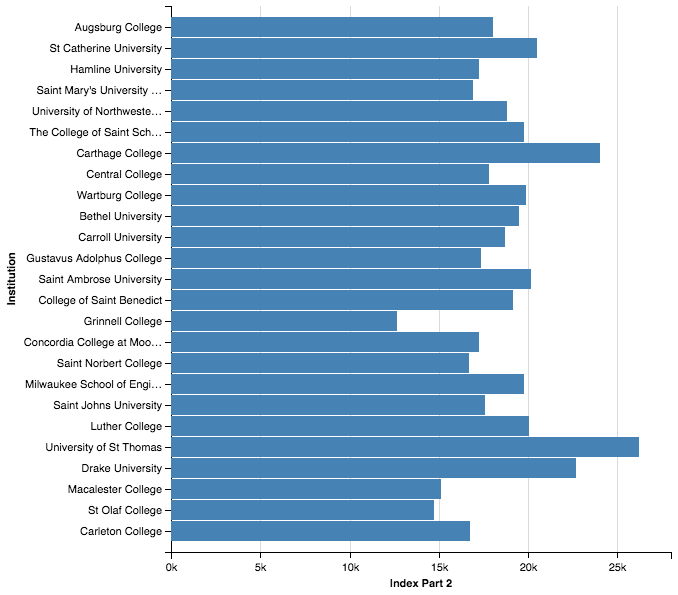

In [265]:
# Chart(smaller).mark_bar().encode(
#     x=X('avg_price', title='Index Part 2'),
#     y=Y('INSTNM', sort=SortField(field='idxp1', order='descending'), title='Institution')
# )

In [266]:
avg_idxp1 = smaller['idxp1'].mean()
avg_idxp2 = smaller['avg_price'].mean()

In [269]:
smaller['p1_adj'] = smaller['idxp1'] / avg_idxp1
smaller['p2_adj'] = smaller['avg_price'] / avg_idxp2

In [271]:
smaller['combined'] = smaller.p1_adj * smaller.p2_adj


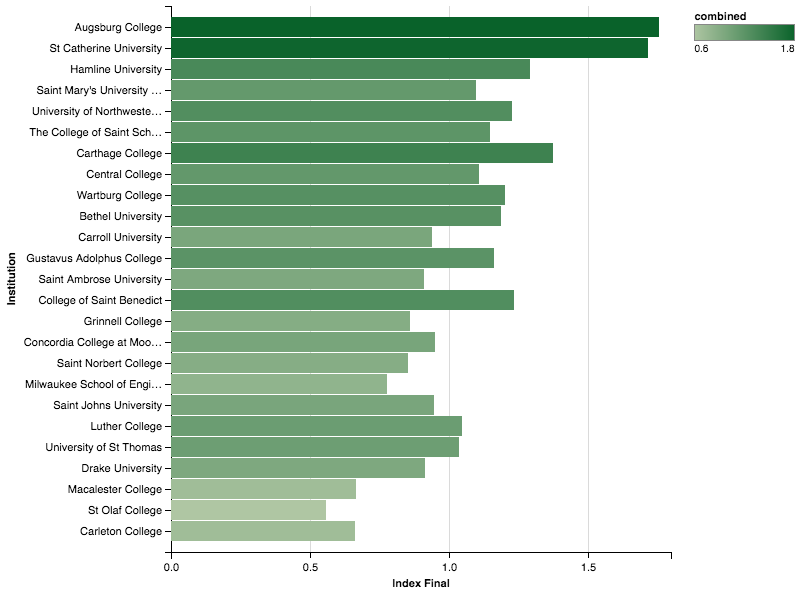

In [273]:
Chart(smaller).mark_bar().encode(
    x=X('combined', title='Index Final'),
    y=Y('INSTNM', sort=SortField(field='combined', order='descending'), title='Institution'),
    color=Color('combined')
)